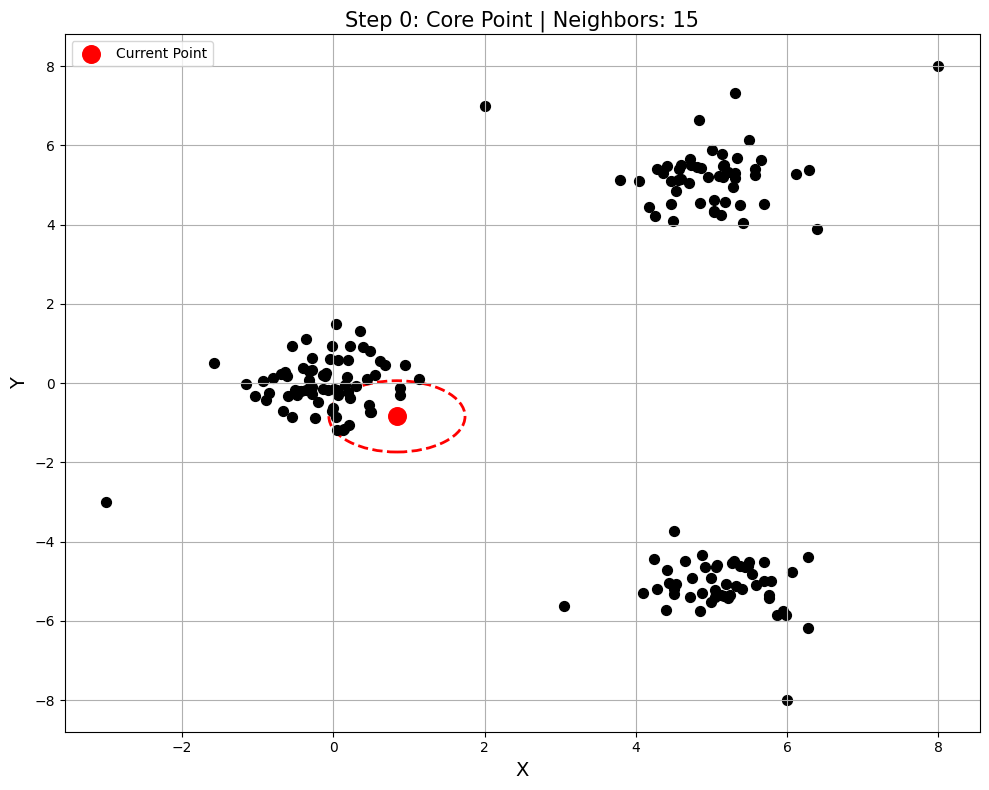

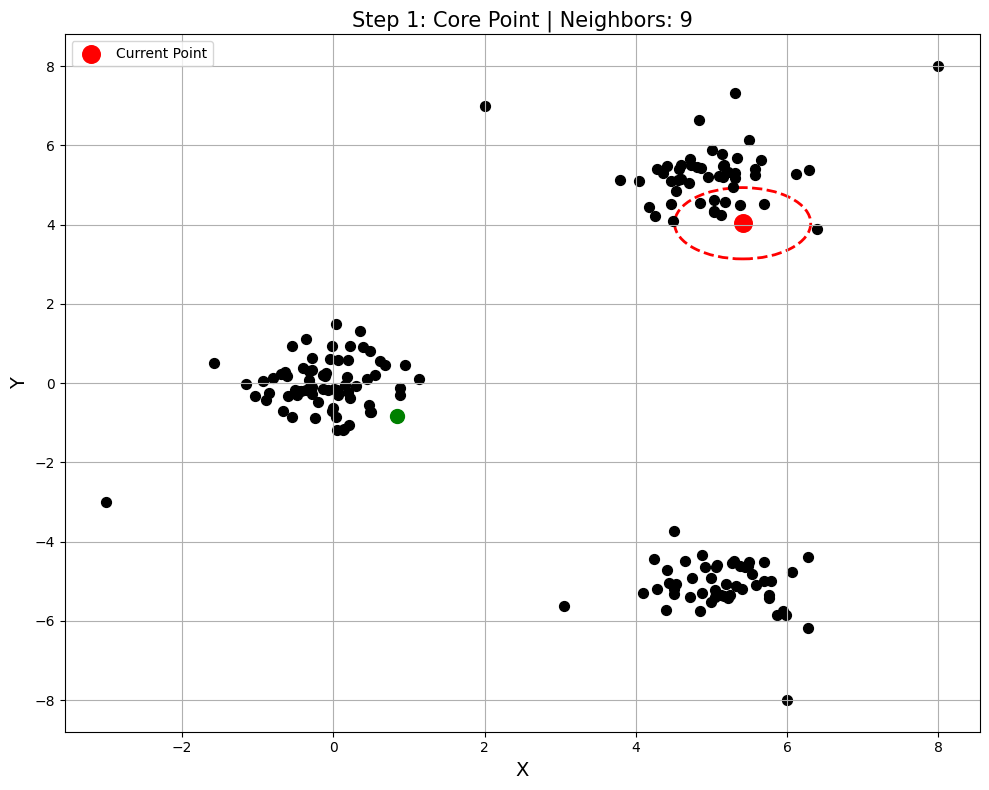

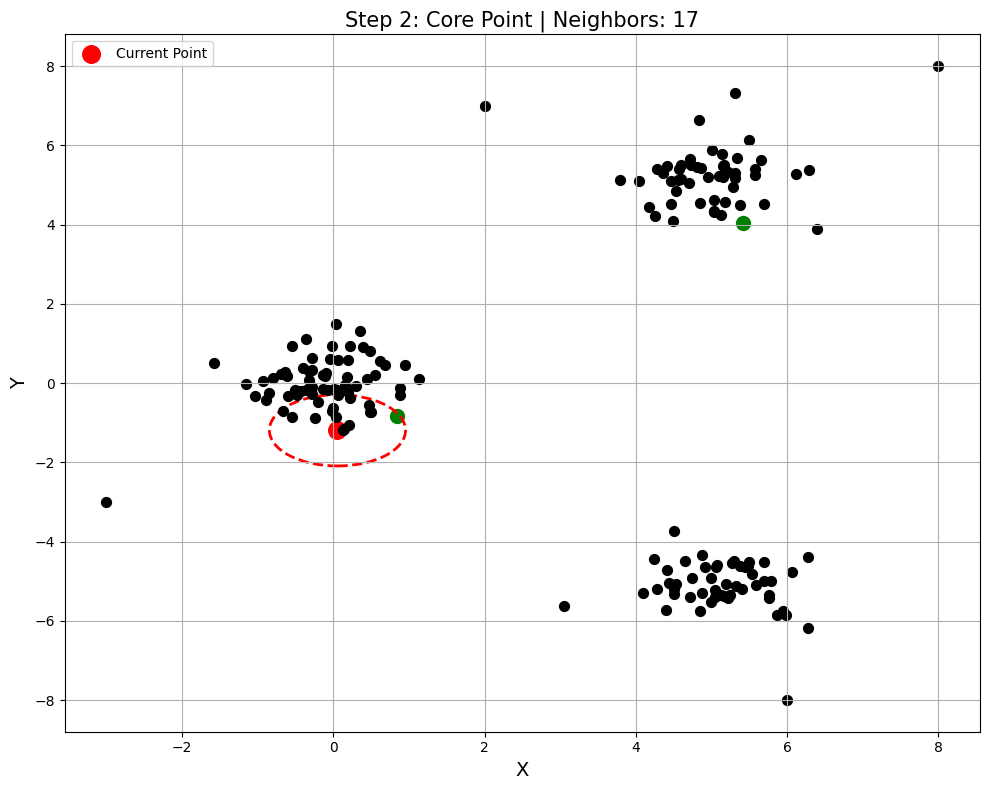

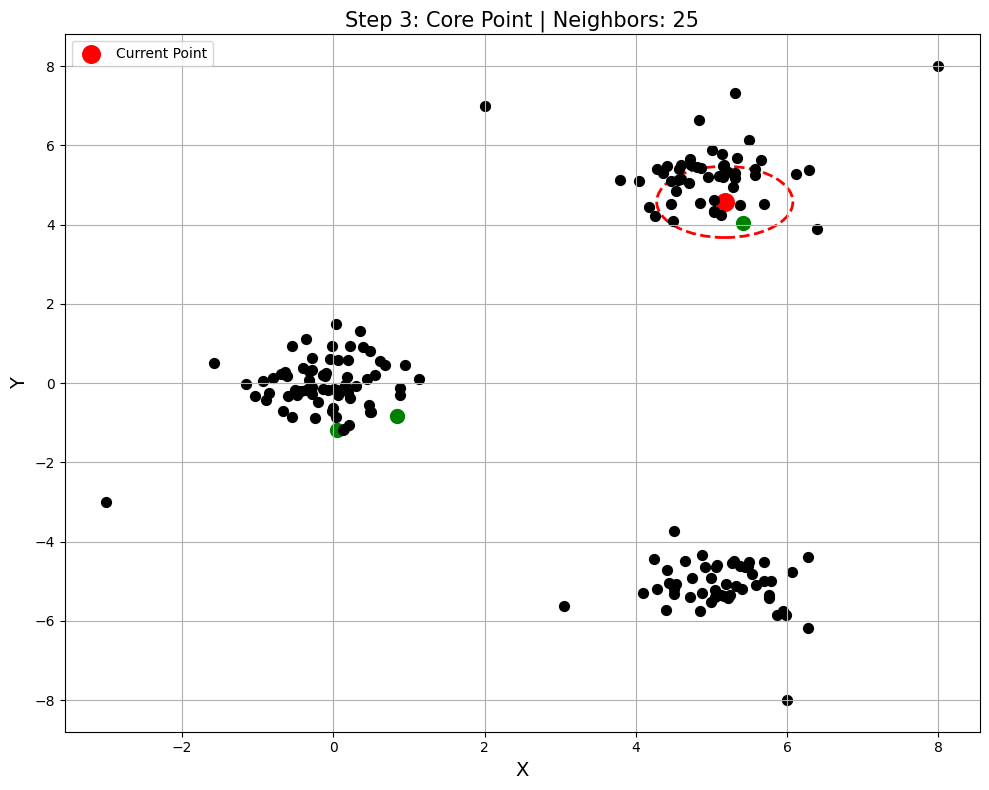

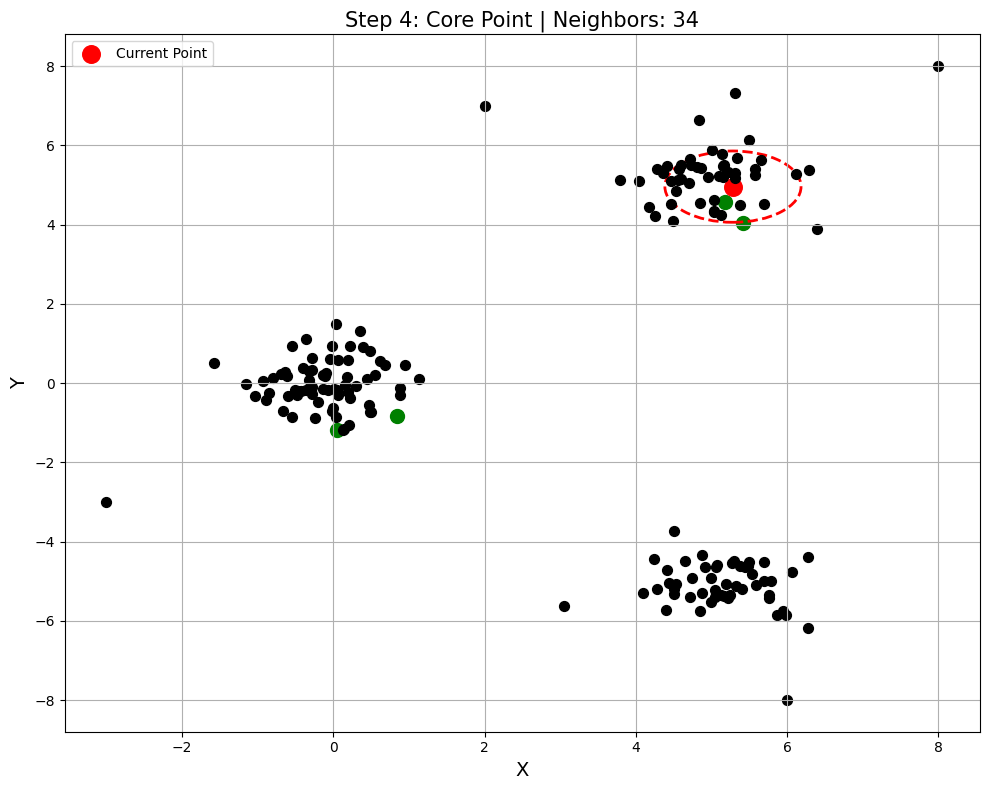

...

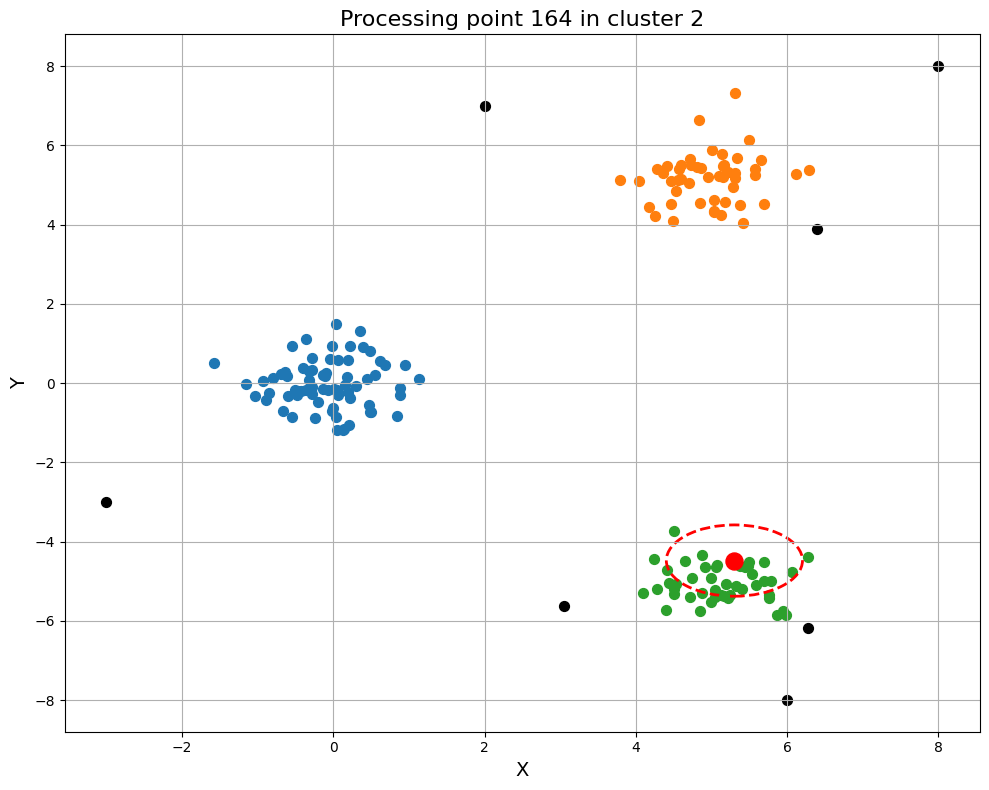

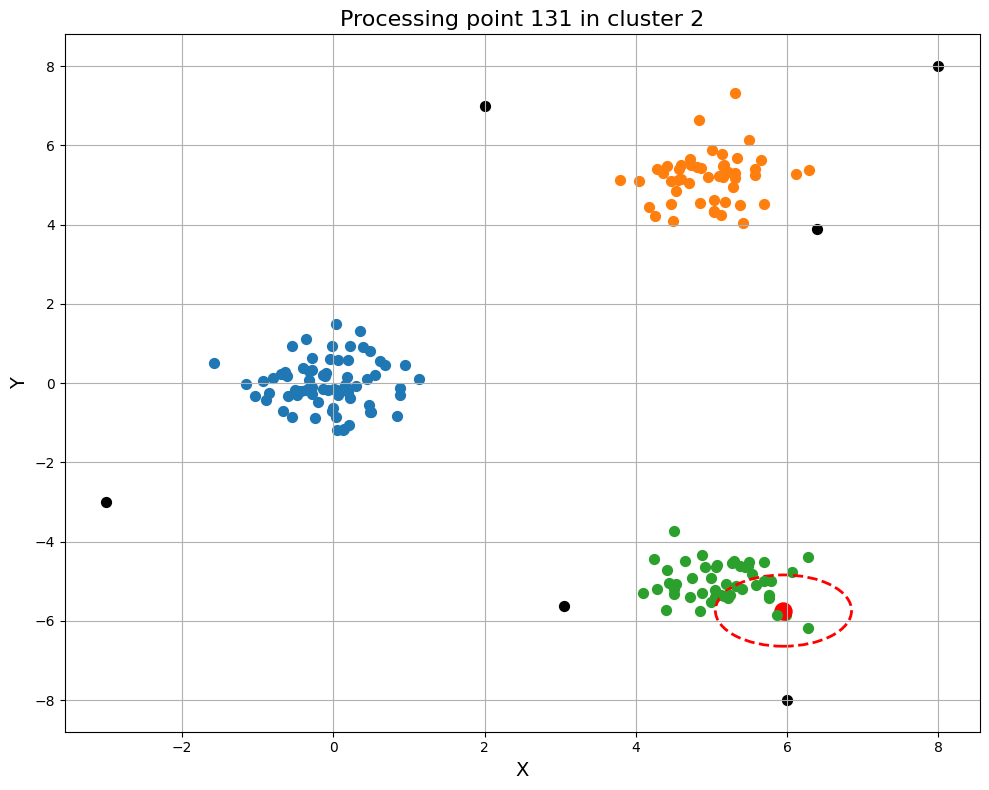

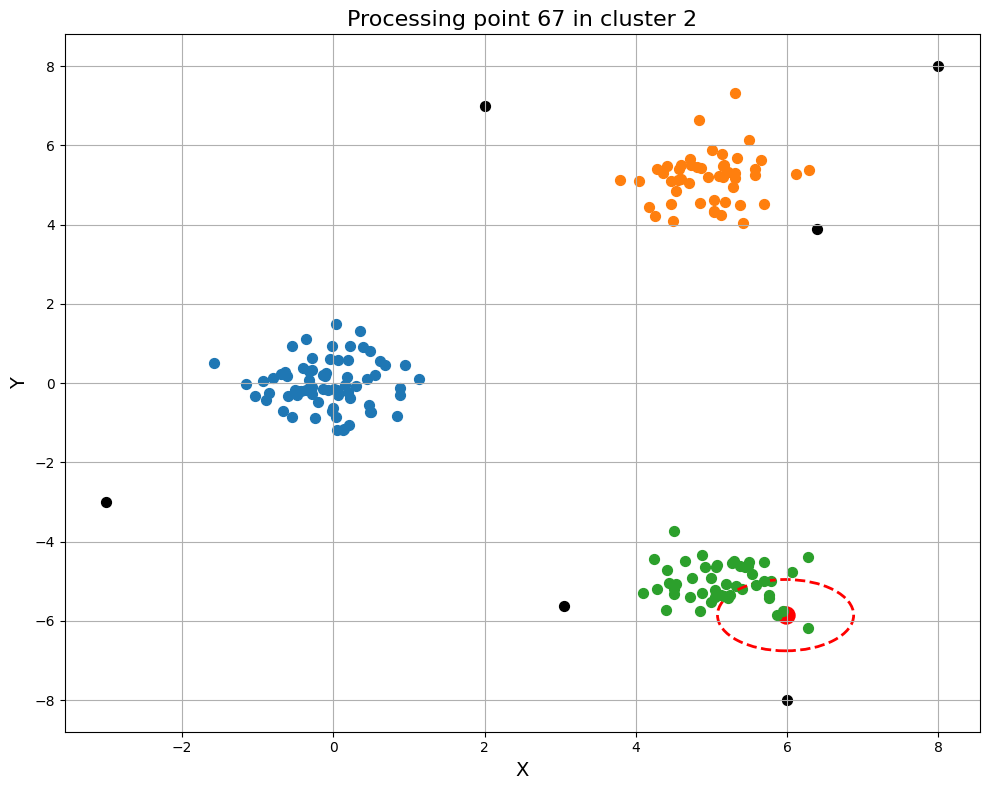

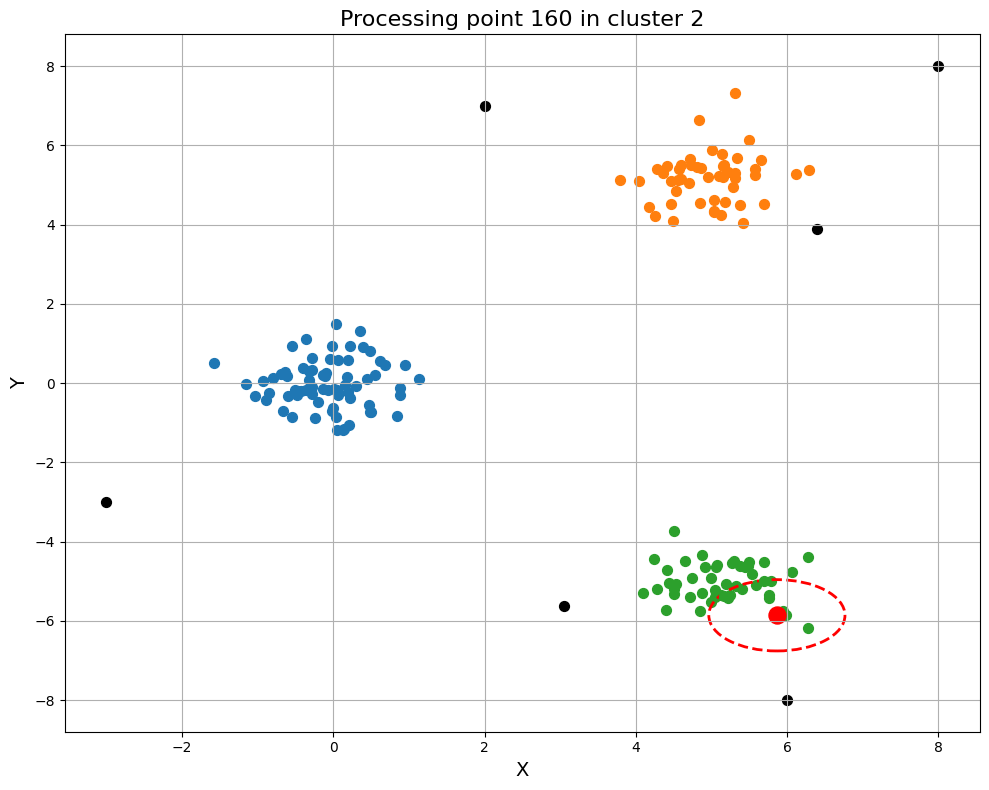

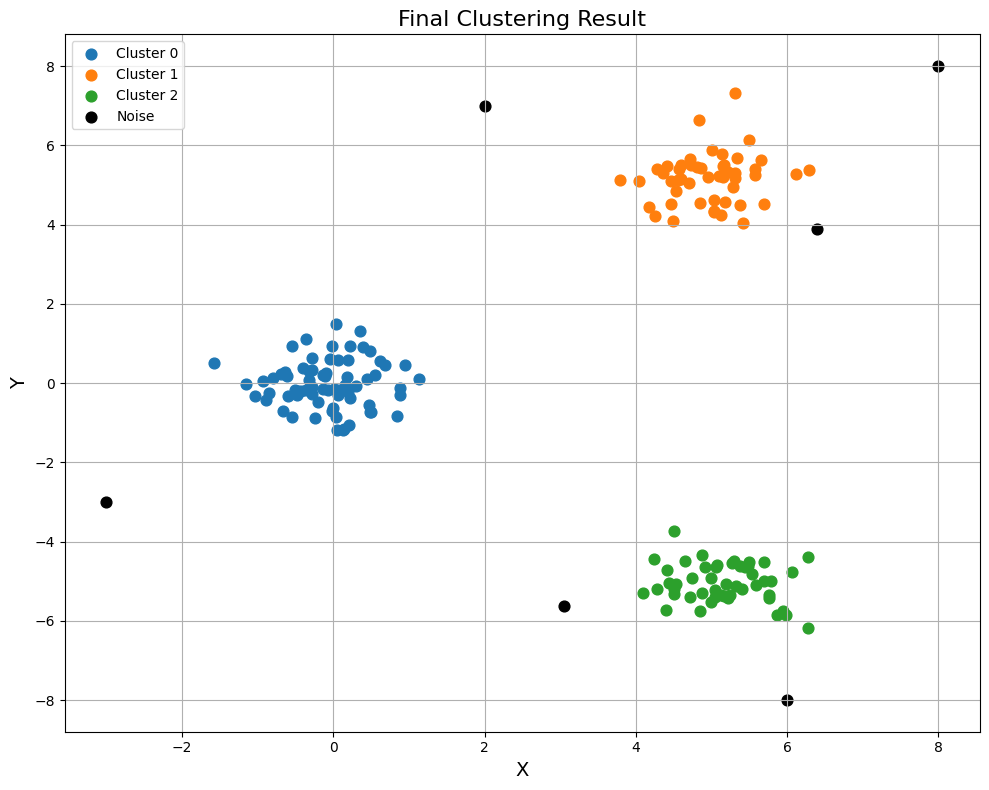

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.metrics.pairwise import euclidean_distances

# === 0. Generate Data ===
centers = [(0, 0), (5, 5), (5, -5)]
X, _ = make_blobs(n_samples=[70, 50, 50], centers=centers, cluster_std=0.6, random_state=42)
noise = np.array([[8, 8], [-3, -3], [2, 7], [6, -8]])
X = np.vstack([X, noise])

# === 1. Parameters ===
eps = 0.9
min_pts = 5
distance_matrix = euclidean_distances(X, X)
neighbors_list = [np.where(distance_matrix[i] <= eps)[0] for i in range(len(X))]
core_points = []
point_colors = ['black'] * len(X)  # default colors

# === 2. Step-by-step Core Point Detection with Permanent Coloring ===
for i in range(len(X)):
    neighbors = neighbors_list[i]
    is_core = len(neighbors) >= min_pts
    if is_core:
        core_points.append(i)
        point_colors[i] = 'green'  # make this point permanently green

    plt.figure(figsize=(10, 8))
    for j in range(len(X)):
        if j == i:
            plt.scatter(X[j, 0], X[j, 1], color='red', s=160, label='Current Point')
            circle = plt.Circle(X[j], eps, color='red', fill=False, linestyle='--', linewidth=2)
            plt.gca().add_patch(circle)
        else:
            plt.scatter(X[j, 0], X[j, 1], color=point_colors[j], s=100 if point_colors[j] == 'green' else 50)
    plt.title(f"Step {i}: {'Core Point' if is_core else 'Non-Core Point'} | Neighbors: {len(neighbors)}", fontsize=15)
    plt.xlabel("X", fontsize=14)
    plt.ylabel("Y", fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# === 3. DBSCAN Clustering ===
labels = [-1] * len(X)
cluster_id = 0

def plot_step(current_idx=None, radius=False, title=None):
    plt.figure(figsize=(10, 8))
    for idx, point in enumerate(X):
        color = 'black'
        size = 50
        if labels[idx] != -1:
            color = plt.cm.tab10(labels[idx] % 10)
        elif idx in core_points:
            color = 'green'
            size = 100
        if idx == current_idx:
            color = 'red'
            size = 150
            if radius:
                circle = plt.Circle(point, eps, color='red', fill=False, linestyle='--', linewidth=2)
                plt.gca().add_patch(circle)
        plt.scatter(point[0], point[1], color=color, s=size)
    if title:
        plt.title(title, fontsize=16)
    plt.xlabel("X", fontsize=14)
    plt.ylabel("Y", fontsize=14)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def expand_cluster(point_idx, cluster_id):
    queue = [point_idx]
    labels[point_idx] = cluster_id
    plot_step(point_idx, radius=True, title=f"Expanding cluster {cluster_id} from point {point_idx}")

    while queue:
        current_point = queue.pop(0)
        current_neighbors = neighbors_list[current_point]

        if len(current_neighbors) >= min_pts:
            for n_idx in current_neighbors:
                if labels[n_idx] == -1:
                    labels[n_idx] = cluster_id
                    if n_idx in core_points:
                        queue.append(n_idx)
        plot_step(current_point, radius=True, title=f"Processing point {current_point} in cluster {cluster_id}")

# === 4. Apply DBSCAN ===
for i in range(len(X)):
    if labels[i] != -1 or i not in core_points:
        continue
    expand_cluster(i, cluster_id)
    cluster_id += 1

# === 5. Final Plot ===
plt.figure(figsize=(10, 8))
unique_labels = set(labels)
for lbl in unique_labels:
    mask = np.array(labels) == lbl
    color = 'black' if lbl == -1 else plt.cm.tab10(lbl % 10)
    label = "Noise" if lbl == -1 else f"Cluster {lbl}"
    plt.scatter(X[mask, 0], X[mask, 1], color=color, label=label, s=60)
plt.title("Final Clustering Result", fontsize=16)
plt.xlabel("X", fontsize=14)
plt.ylabel("Y", fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
